# Appendix XII


## Volatility Analysis

### Data Dukascopy Bank: Forex EUR/USD - 2020


In [1]:
# TensorFlow and tf.keras

import tensorflow as tf
from tensorflow import keras

In [2]:
print(tf.__version__)

2.10.0-dev20220604


In [3]:
# import

import numpy as np                  
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
from tqdm import tqdm


In [5]:
#  plotly

import chart_studio.plotly as py
import plotly.graph_objects as go
from plotly.offline import iplot
import cufflinks as cf   
cf.go_offline()

### Preliminary Data Analysis (2020) 

In [14]:
data_raw = pd.read_csv('Data/EURUSD_Ticks_2020.01.01_2020.12.31.csv', low_memory=False, sep=',')

print(data_raw.head(n=5))
print(data_raw[-5:]) 

                Time (UTC)      Ask      Bid  AskVolume  BidVolume
0  2020.01.01 22:01:12.821  1.12160  1.12106     0.0937       0.75
1  2020.01.01 22:01:17.176  1.12160  1.12120     0.0937       0.75
2  2020.01.01 22:01:18.545  1.12160  1.12117     0.0937       0.75
3  2020.01.01 22:01:19.145  1.12161  1.12123     0.8400       0.75
4  2020.01.01 22:01:19.246  1.12161  1.12120     0.8400       0.75
                       Time (UTC)      Ask      Bid  AskVolume  BidVolume
32758623  2020.12.31 21:59:56.150  1.22177  1.22142       7.50       0.75
32758624  2020.12.31 21:59:56.252  1.22177  1.22141       7.50       0.75
32758625  2020.12.31 21:59:56.419  1.22178  1.22141       7.50       1.50
32758626  2020.12.31 21:59:57.217  1.22181  1.22141       0.37       0.75
32758627  2020.12.31 21:59:59.120  1.22174  1.22141       7.50       0.75


In [15]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32758628 entries, 0 to 32758627
Data columns (total 5 columns):
 #   Column      Dtype  
---  ------      -----  
 0   Time (UTC)  object 
 1   Ask         float64
 2   Bid         float64
 3   AskVolume   float64
 4   BidVolume   float64
dtypes: float64(4), object(1)
memory usage: 1.2+ GB


In [16]:
N = 1500000

In [17]:
# sample-2

indexes_to_drop = np.array(range(N,data_raw.shape[0]))
indexes_to_keep = set(range(data_raw.shape[0])) - set(indexes_to_drop)
data2 = data_raw.take(list(indexes_to_keep))

print(data2.head(n=5)) 
print(data2[-5:]) 


                Time (UTC)      Ask      Bid  AskVolume  BidVolume
0  2020.01.01 22:01:12.821  1.12160  1.12106     0.0937       0.75
1  2020.01.01 22:01:17.176  1.12160  1.12120     0.0937       0.75
2  2020.01.01 22:01:18.545  1.12160  1.12117     0.0937       0.75
3  2020.01.01 22:01:19.145  1.12161  1.12123     0.8400       0.75
4  2020.01.01 22:01:19.246  1.12161  1.12120     0.8400       0.75
                      Time (UTC)      Ask      Bid  AskVolume  BidVolume
1499995  2020.01.30 07:11:33.290  1.10087  1.10086       0.45       0.75
1499996  2020.01.30 07:11:33.392  1.10086  1.10083       0.75       4.57
1499997  2020.01.30 07:11:37.666  1.10086  1.10084       0.75       0.75
1499998  2020.01.30 07:11:37.768  1.10087  1.10085       2.44       1.50
1499999  2020.01.30 07:11:38.045  1.10086  1.10084       0.75       1.50


In [18]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500000 entries, 0 to 1499999
Data columns (total 5 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   Time (UTC)  1500000 non-null  object 
 1   Ask         1500000 non-null  float64
 2   Bid         1500000 non-null  float64
 3   AskVolume   1500000 non-null  float64
 4   BidVolume   1500000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 68.7+ MB


In [19]:
#sample-3

N0 = 4500000  
N = 1500000 + N0

indexes_to_drop1 = np.array(range(N,data_raw.shape[0]))
indexes_to_drop2 = np.array(range(0,N0))
indexes_to_keep = set(range(data_raw.shape[0])) - set(indexes_to_drop1) - set(indexes_to_drop2)
data3 = data_raw.take(list(indexes_to_keep))

print(data3.head(n=5)) 
print(data3.tail(5)) 
print(data3.shape)

                      Time (UTC)      Ask      Bid  AskVolume  BidVolume
4500000  2020.03.10 17:18:51.089  1.13075  1.13070       0.94       1.20
4500001  2020.03.10 17:18:51.646  1.13073  1.13071       0.75       0.37
4500002  2020.03.10 17:18:51.697  1.13073  1.13069       0.75       0.56
4500003  2020.03.10 17:18:51.798  1.13074  1.13070       0.94       1.12
4500004  2020.03.10 17:18:51.899  1.13074  1.13071       0.19       1.12
                      Time (UTC)      Ask      Bid  AskVolume  BidVolume
5999995  2020.03.17 19:37:31.855  1.10055  1.10050       0.19       0.82
5999996  2020.03.17 19:37:32.216  1.10055  1.10049       0.19       0.82
5999997  2020.03.17 19:37:33.192  1.10052  1.10047       0.19       1.50
5999998  2020.03.17 19:37:33.294  1.10048  1.10042       0.19       0.82
5999999  2020.03.17 19:37:33.426  1.10047  1.10041       0.56       0.75
(1500000, 5)


In [20]:
data3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500000 entries, 4500000 to 5999999
Data columns (total 5 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   Time (UTC)  1500000 non-null  object 
 1   Ask         1500000 non-null  float64
 2   Bid         1500000 non-null  float64
 3   AskVolume   1500000 non-null  float64
 4   BidVolume   1500000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 68.7+ MB


In [19]:
# compression

pd.options.mode.chained_assignment = None  # default='warn'

data2['Ask']       = pd.to_numeric(data2['Ask'],downcast='float')
data2['Bid']       = pd.to_numeric(data2['Bid'],downcast='float')
data2['AskVolume'] = pd.to_numeric(data2['AskVolume'],downcast='float')
data2['BidVolume'] = pd.to_numeric(data2['BidVolume'],downcast='float')

data3['Ask']       = pd.to_numeric(data3['Ask'],downcast='float')
data3['Bid']       = pd.to_numeric(data3['Bid'],downcast='float')
data3['AskVolume'] = pd.to_numeric(data3['AskVolume'],downcast='float')
data3['BidVolume'] = pd.to_numeric(data3['BidVolume'],downcast='float')

print(data2.info())

print(data3.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500000 entries, 0 to 1499999
Data columns (total 5 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   Time (UTC)  1500000 non-null  object 
 1   Ask         1500000 non-null  float32
 2   Bid         1500000 non-null  float32
 3   AskVolume   1500000 non-null  float32
 4   BidVolume   1500000 non-null  float32
dtypes: float32(4), object(1)
memory usage: 45.8+ MB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500000 entries, 4500000 to 5999999
Data columns (total 5 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   Time (UTC)  1500000 non-null  object 
 1   Ask         1500000 non-null  float32
 2   Bid         1500000 non-null  float32
 3   AskVolume   1500000 non-null  float32
 4   BidVolume   1500000 non-null  float32
dtypes: float32(4), object(1)
memory usage: 45.8+ MB
None


In [20]:
data2[:6]

,Time (UTC),Ask,Bid,AskVolume,BidVolume
0,2020.01.01 22:01:12.821,1.12160,1.12106,0.0937,0.75
1,2020.01.01 22:01:17.176,1.12160,1.12120,0.0937,0.75
2,2020.01.01 22:01:18.545,1.12160,1.12117,0.0937,0.75
3,2020.01.01 22:01:19.145,1.12161,1.12123,0.8400,0.75
4,2020.01.01 22:01:19.246,1.12161,1.12120,0.8400,0.75
5,2020.01.01 22:01:21.124,1.12161,1.12122,0.0937,0.75


In [21]:
data3[:6]

,Time (UTC),Ask,Bid,AskVolume,BidVolume
4500000,2020.03.10 17:18:51.089,1.13075,1.13070,0.94,1.20
4500001,2020.03.10 17:18:51.646,1.13073,1.13071,0.75,0.37
4500002,2020.03.10 17:18:51.697,1.13073,1.13069,0.75,0.56
4500003,2020.03.10 17:18:51.798,1.13074,1.13070,0.94,1.12
4500004,2020.03.10 17:18:51.899,1.13074,1.13071,0.19,1.12
4500005,2020.03.10 17:18:51.950,1.13075,1.13073,0.19,0.37


### Date

In [22]:

pd.to_datetime(['31/07/2017', 'test'], errors='coerce') # errors='coerce'  

data_raw['DateT'] = pd.to_datetime(data_raw['Time (UTC)'])
print(data_raw.dtypes)
print(data_raw.head(n=5)) 
print(data_raw[-5:]) 

Time (UTC)            object
Ask                  float64
Bid                  float64
AskVolume            float64
BidVolume            float64
DateT         datetime64[ns]
dtype: object
                Time (UTC)      Ask      Bid  AskVolume  BidVolume  \
0  2020.01.01 22:01:12.821  1.12160  1.12106     0.0937       0.75   
1  2020.01.01 22:01:17.176  1.12160  1.12120     0.0937       0.75   
2  2020.01.01 22:01:18.545  1.12160  1.12117     0.0937       0.75   
3  2020.01.01 22:01:19.145  1.12161  1.12123     0.8400       0.75   
4  2020.01.01 22:01:19.246  1.12161  1.12120     0.8400       0.75   

                    DateT  
0 2020-01-01 22:01:12.821  
1 2020-01-01 22:01:17.176  
2 2020-01-01 22:01:18.545  
3 2020-01-01 22:01:19.145  
4 2020-01-01 22:01:19.246  
                       Time (UTC)      Ask      Bid  AskVolume  BidVolume  \
16586025  2020.06.30 23:58:40.816  1.12337  1.12333       0.75       5.06   
16586026  2020.06.30 23:58:40.917  1.12338  1.12333       1.57       

In [23]:
pd.to_datetime(['31/07/2017', 'test'], errors='coerce') # errors='coerce' - 

# reformate date
data2['DateT'] = pd.to_datetime(data2['Time (UTC)'])

print(data2.dtypes)
print(data2.head(n=5)) 
print(data2[-5:]) 

Time (UTC)            object
Ask                  float32
Bid                  float32
AskVolume            float32
BidVolume            float32
DateT         datetime64[ns]
dtype: object
                Time (UTC)      Ask      Bid  AskVolume  BidVolume  \
0  2020.01.01 22:01:12.821  1.12160  1.12106     0.0937       0.75   
1  2020.01.01 22:01:17.176  1.12160  1.12120     0.0937       0.75   
2  2020.01.01 22:01:18.545  1.12160  1.12117     0.0937       0.75   
3  2020.01.01 22:01:19.145  1.12161  1.12123     0.8400       0.75   
4  2020.01.01 22:01:19.246  1.12161  1.12120     0.8400       0.75   

                    DateT  
0 2020-01-01 22:01:12.821  
1 2020-01-01 22:01:17.176  
2 2020-01-01 22:01:18.545  
3 2020-01-01 22:01:19.145  
4 2020-01-01 22:01:19.246  
                      Time (UTC)      Ask      Bid  AskVolume  BidVolume  \
1499995  2020.01.30 07:11:33.290  1.10087  1.10086       0.45       0.75   
1499996  2020.01.30 07:11:33.392  1.10086  1.10083       0.75       4.5

In [24]:
# reformate date
data3['DateT'] = pd.to_datetime(data3['Time (UTC)'])

print(data3.dtypes)
print(data3.head(n=5)) 
print(data3[-5:]) 

Time (UTC)            object
Ask                  float32
Bid                  float32
AskVolume            float32
BidVolume            float32
DateT         datetime64[ns]
dtype: object
                      Time (UTC)      Ask      Bid  AskVolume  BidVolume  \
4500000  2020.03.10 17:18:51.089  1.13075  1.13070       0.94       1.20   
4500001  2020.03.10 17:18:51.646  1.13073  1.13071       0.75       0.37   
4500002  2020.03.10 17:18:51.697  1.13073  1.13069       0.75       0.56   
4500003  2020.03.10 17:18:51.798  1.13074  1.13070       0.94       1.12   
4500004  2020.03.10 17:18:51.899  1.13074  1.13071       0.19       1.12   

                          DateT  
4500000 2020-03-10 17:18:51.089  
4500001 2020-03-10 17:18:51.646  
4500002 2020-03-10 17:18:51.697  
4500003 2020-03-10 17:18:51.798  
4500004 2020-03-10 17:18:51.899  
                      Time (UTC)      Ask      Bid  AskVolume  BidVolume  \
5999995  2020.03.17 19:37:31.855  1.10055  1.10050       0.19       0.82   

In [25]:
import datetime

In [26]:

n = data_raw.shape[0]    

data_raw['DateDelta'] = data_raw['DateT'].astype('int64')  

data_raw['DateDelta'] = data_raw['DateDelta'].div(1000000 , axis=0)  
data_raw['DateDelta'] = data_raw['DateDelta'].astype('int64')    
data_raw['DateDelta1'] = data_raw['DateDelta'].diff()                                             


#  cleaning 'NaN'
data_raw['DateDelta1'].iloc[0] = 0  

data_raw['DateDelta1'] = data_raw['DateDelta1'].astype(int)    
    
print(data_raw.dtypes)
print(data_raw.head(n=5)) 
print(data_raw[-5:]) 
print(data_raw['DateDelta1'].iloc[:4])

Time (UTC)            object
Ask                  float64
Bid                  float64
AskVolume            float64
BidVolume            float64
DateT         datetime64[ns]
DateDelta              int64
DateDelta1             int32
dtype: object
                Time (UTC)      Ask      Bid  AskVolume  BidVolume  \
0  2020.01.01 22:01:12.821  1.12160  1.12106     0.0937       0.75   
1  2020.01.01 22:01:17.176  1.12160  1.12120     0.0937       0.75   
2  2020.01.01 22:01:18.545  1.12160  1.12117     0.0937       0.75   
3  2020.01.01 22:01:19.145  1.12161  1.12123     0.8400       0.75   
4  2020.01.01 22:01:19.246  1.12161  1.12120     0.8400       0.75   

                    DateT      DateDelta  DateDelta1  
0 2020-01-01 22:01:12.821  1577916072821           0  
1 2020-01-01 22:01:17.176  1577916077176        4355  
2 2020-01-01 22:01:18.545  1577916078545        1369  
3 2020-01-01 22:01:19.145  1577916079145         600  
4 2020-01-01 22:01:19.246  1577916079246         101  
   

In [27]:

n = data2.shape[0]    

data2['DateDelta'] = data2['DateT'].astype('int64') 

data2['DateDelta'] = data2['DateDelta'].div(1000000 , axis=0)  
data2['DateDelta'] = data2['DateDelta'].astype('int64')    
data2['DateDelta1'] = data2['DateDelta'].diff()                                              

data2['DateDelta1'].iloc[0] = 0  #
data2['DateDelta1'] = data2['DateDelta1'].astype(int)  
    
print(data2.dtypes)
print(data2.head(n=5)) 
print(data2[-5:]) 
print(data2['DateDelta1'].iloc[:4])

Time (UTC)            object
Ask                  float32
Bid                  float32
AskVolume            float32
BidVolume            float32
DateT         datetime64[ns]
DateDelta              int64
DateDelta1             int32
dtype: object
                Time (UTC)      Ask      Bid  AskVolume  BidVolume  \
0  2020.01.01 22:01:12.821  1.12160  1.12106     0.0937       0.75   
1  2020.01.01 22:01:17.176  1.12160  1.12120     0.0937       0.75   
2  2020.01.01 22:01:18.545  1.12160  1.12117     0.0937       0.75   
3  2020.01.01 22:01:19.145  1.12161  1.12123     0.8400       0.75   
4  2020.01.01 22:01:19.246  1.12161  1.12120     0.8400       0.75   

                    DateT      DateDelta  DateDelta1  
0 2020-01-01 22:01:12.821  1577916072821           0  
1 2020-01-01 22:01:17.176  1577916077176        4355  
2 2020-01-01 22:01:18.545  1577916078545        1369  
3 2020-01-01 22:01:19.145  1577916079145         600  
4 2020-01-01 22:01:19.246  1577916079246         101  
   

In [28]:

n = data3.shape[0]    

data3['DateDelta'] = data3['DateT'].astype('int64')  

data3['DateDelta'] = data3['DateDelta'].div(1000000 , axis=0)  
data3['DateDelta'] = data3['DateDelta'].astype('int64')    
data3['DateDelta1'] = data3['DateDelta'].diff()                                             


data3['DateDelta1'].iloc[0] = 0  
data3['DateDelta1'] = data3['DateDelta1'].astype(int)    
    
print(data3.dtypes)
print(data3.head(n=5)) 
print(data3[-5:]) 
print(data3['DateDelta1'].iloc[:4])

Time (UTC)            object
Ask                  float32
Bid                  float32
AskVolume            float32
BidVolume            float32
DateT         datetime64[ns]
DateDelta              int64
DateDelta1             int32
dtype: object
                      Time (UTC)      Ask      Bid  AskVolume  BidVolume  \
4500000  2020.03.10 17:18:51.089  1.13075  1.13070       0.94       1.20   
4500001  2020.03.10 17:18:51.646  1.13073  1.13071       0.75       0.37   
4500002  2020.03.10 17:18:51.697  1.13073  1.13069       0.75       0.56   
4500003  2020.03.10 17:18:51.798  1.13074  1.13070       0.94       1.12   
4500004  2020.03.10 17:18:51.899  1.13074  1.13071       0.19       1.12   

                          DateT      DateDelta  DateDelta1  
4500000 2020-03-10 17:18:51.089  1583860731089           0  
4500001 2020-03-10 17:18:51.646  1583860731646         557  
4500002 2020-03-10 17:18:51.697  1583860731697          51  
4500003 2020-03-10 17:18:51.798  1583860731798       

In [29]:
# Millisecond

mmx  = data_raw['DateDelta1'].max()
mmn  = data_raw['DateDelta1'].min()
print(mmx, ' ', mmn)

mmx  = data_raw['DateDelta'].max()
mmn  = data_raw['DateDelta'].min()
print(mmx, ' ', mmn)

173188984   0
1593561535919   1577916072821


In [30]:
mmx  = data2['DateDelta1'].max()
mmn  = data2['DateDelta1'].min()
print(mmx, ' ', mmn)

mmx  = data2['DateDelta'].max()
mmn  = data2['DateDelta'].min()
print(mmx, ' ', mmn)

172860715   0
1580368298045   1577916072821


In [31]:
mmx  = data3['DateDelta1'].max()
mmn  = data3['DateDelta1'].min()
print(mmx, ' ', mmn)

mmx  = data3['DateDelta'].max()
mmn  = data3['DateDelta'].min()
print(mmx, ' ', mmn)

172875221   0
1584473853425   1583860731089


In [32]:
# Find weekends
# 2 days * 24 hours * 60 minutes * 60 sec = 172.800 seconds = 172.800.000 milliseconds

#  DateDelta1 > 100000 milliseconds (pauses)
data2[data2.DateDelta1 > 100000]

,Time (UTC),Ask,Bid,AskVolume,BidVolume,DateT,DateDelta,DateDelta1
80111,2020.01.02 22:22:47.339,1.11736,1.11710,1.1200,1.92,2020-01-02 22:22:47.339,1578003767339,185349
168840,2020.01.05 22:00:22.039,1.11687,1.11656,0.7500,0.75,2020-01-05 22:00:22.039,1578261622039,172826531
169150,2020.01.05 22:38:29.241,1.11622,1.11605,0.7500,0.75,2020-01-05 22:38:29.241,1578263909241,102757
169251,2020.01.05 22:55:32.854,1.11620,1.11602,0.7500,0.75,2020-01-05 22:55:32.854,1578264932854,132969
246129,2020.01.06 22:26:20.727,1.11962,1.11960,0.1000,0.89,2020-01-06 22:26:20.727,1578349580727,105034
445476,2020.01.08 21:37:24.104,1.11093,1.11089,1.5000,2.70,2020-01-08 21:37:24.104,1578519444104,116648
596235,2020.01.12 22:00:03.473,1.11183,1.11141,0.7500,0.75,2020-01-12 22:00:03.473,1578866403473,172860715
937913,2020.01.19 22:00:39.388,1.10940,1.10910,1.5000,0.75,2020-01-19 22:00:39.388,1579471239388,172846669
938167,2020.01.19 22:17:05.091,1.10920,1.10911,0.0187,0.75,2020-01-19 22:17:05.091,1579472225091,107093
986400,2020.01.20 22:04:04.062,1.10951,1.10947,0.5600,4.00,2020-01-20 22:04:04.062,1579557844062,109938


In [33]:
data3[data3.DateDelta1 > 100000]

,Time (UTC),Ask,Bid,AskVolume,BidVolume,DateT,DateDelta,DateDelta1
5319481,2020.03.15 21:00:37.540,1.10779,1.10705,0.75,0.75,2020-03-15 21:00:37.540,1584306037540,172875221
5703021,2020.03.16 21:10:59.443,1.11764,1.11761,0.75,0.37,2020-03-16 21:10:59.443,1584393059443,102046


In [34]:
data_raw[data_raw.DateDelta1 > 160000000]

,Time (UTC),Ask,Bid,AskVolume,BidVolume,DateT,DateDelta,DateDelta1
168840,2020.01.05 22:00:22.039,1.11687,1.11656,0.75,0.75,2020-01-05 22:00:22.039,1578261622039,172826531
596235,2020.01.12 22:00:03.473,1.11183,1.11141,0.75,0.75,2020-01-12 22:00:03.473,1578866403473,172860715
937913,2020.01.19 22:00:39.388,1.10940,1.10910,1.50,0.75,2020-01-19 22:00:39.388,1579471239388,172846669
1276585,2020.01.26 22:00:06.713,1.10355,1.10318,0.37,0.75,2020-01-26 22:00:06.713,1580076006713,172810298
1637760,2020.02.02 22:00:14.503,1.10957,1.10939,0.75,0.75,2020-02-02 22:00:14.503,1580680814503,172818305
1951341,2020.02.09 22:00:03.235,1.09479,1.09439,1.31,0.75,2020-02-09 22:00:03.235,1581285603235,172806909
2262899,2020.02.16 22:00:01.861,1.08428,1.08406,0.75,0.56,2020-02-16 22:00:01.861,1581890401861,172805780
2581015,2020.02.23 22:00:02.104,1.08163,1.08145,1.31,0.75,2020-02-23 22:00:02.104,1582495202104,172805815
3199857,2020.03.01 22:00:01.729,1.10482,1.10423,0.75,1.31,2020-03-01 22:00:01.729,1583100001729,172805437
3976886,2020.03.08 21:00:04.528,1.13538,1.13473,0.75,0.75,2020-03-08 21:00:04.528,1583701204528,169207847


In [36]:

data_raw_weekends = data_raw[data_raw.DateDelta1 > 1600000]


columns_1 = ['Time (UTC)', 'DateDelta']
data_raw_weekends.drop(columns_1,inplace=True, axis=1)
data_raw_weekends.info()
data_raw_weekends

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26 entries, 168840 to 16376109
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Ask         26 non-null     float64       
 1   Bid         26 non-null     float64       
 2   AskVolume   26 non-null     float64       
 3   BidVolume   26 non-null     float64       
 4   DateT       26 non-null     datetime64[ns]
 5   DateDelta1  26 non-null     int32         
dtypes: datetime64[ns](1), float64(4), int32(1)
memory usage: 1.3 KB


,Ask,Bid,AskVolume,BidVolume,DateT,DateDelta1
168840,1.11687,1.11656,0.75,0.75,2020-01-05 22:00:22.039,172826531
596235,1.11183,1.11141,0.75,0.75,2020-01-12 22:00:03.473,172860715
937913,1.10940,1.10910,1.50,0.75,2020-01-19 22:00:39.388,172846669
1276585,1.10355,1.10318,0.37,0.75,2020-01-26 22:00:06.713,172810298
1637760,1.10957,1.10939,0.75,0.75,2020-02-02 22:00:14.503,172818305
1951341,1.09479,1.09439,1.31,0.75,2020-02-09 22:00:03.235,172806909
2262899,1.08428,1.08406,0.75,0.56,2020-02-16 22:00:01.861,172805780
2581015,1.08163,1.08145,1.31,0.75,2020-02-23 22:00:02.104,172805815
3199857,1.10482,1.10423,0.75,1.31,2020-03-01 22:00:01.729,172805437
3976886,1.13538,1.13473,0.75,0.75,2020-03-08 21:00:04.528,169207847


In [37]:

data2_weekends = data2[data2.DateDelta1 > 1600000]

# dropping
columns_1 = ['Time (UTC)', 'DateDelta']
data2_weekends.drop(columns_1,inplace=True, axis=1)
data2_weekends.info()
data2_weekends

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4 entries, 168840 to 1276585
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Ask         4 non-null      float32       
 1   Bid         4 non-null      float32       
 2   AskVolume   4 non-null      float32       
 3   BidVolume   4 non-null      float32       
 4   DateT       4 non-null      datetime64[ns]
 5   DateDelta1  4 non-null      int32         
dtypes: datetime64[ns](1), float32(4), int32(1)
memory usage: 144.0 bytes


,Ask,Bid,AskVolume,BidVolume,DateT,DateDelta1
168840,1.11687,1.11656,0.75,0.75,2020-01-05 22:00:22.039,172826531
596235,1.11183,1.11141,0.75,0.75,2020-01-12 22:00:03.473,172860715
937913,1.10940,1.10910,1.50,0.75,2020-01-19 22:00:39.388,172846669
1276585,1.10355,1.10318,0.37,0.75,2020-01-26 22:00:06.713,172810298


In [38]:
# new week
data3_weekends = data3[data3.DateDelta1 > 1600000]

columns_1 = ['Time (UTC)', 'DateDelta']
data3_weekends.drop(columns_1,inplace=True, axis=1)
data3_weekends.info()
data3_weekends

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1 entries, 5319481 to 5319481
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Ask         1 non-null      float32       
 1   Bid         1 non-null      float32       
 2   AskVolume   1 non-null      float32       
 3   BidVolume   1 non-null      float32       
 4   DateT       1 non-null      datetime64[ns]
 5   DateDelta1  1 non-null      int32         
dtypes: datetime64[ns](1), float32(4), int32(1)
memory usage: 36.0 bytes


,Ask,Bid,AskVolume,BidVolume,DateT,DateDelta1
5319481,1.10779,1.10705,0.75,0.75,2020-03-15 21:00:37.540,172875221


In [39]:

data_raw_week_start_index = data_raw_weekends.index.tolist()
data_raw_week_start_index = np.array(data_raw_week_start_index)

print("data_raw_week_start_index:")
print(type(data_raw_week_start_index))
print(data_raw_week_start_index.shape)
# print('\n')
print(data_raw_week_start_index) 

data_raw_week_start_index:
<class 'numpy.ndarray'>
(26,)
[  168840   596235   937913  1276585  1637760  1951341  2262899  2581015
  3199857  3976886  5319481  7131362  8515962  9389506 10029255 10619973
 11177560 11693053 12181692 12661526 13096424 13639145 14312617 15047417
 15776539 16376109]


In [40]:

data2_week_start_index = data2_weekends.index.tolist()
data2_week_start_index = np.array(data2_week_start_index)

print("data2_week_start_index:")
print(type(data2_week_start_index))
print(data2_week_start_index.shape)
# print('\n')
print(data2_week_start_index) 

data2_week_start_index:
<class 'numpy.ndarray'>
(4,)
[ 168840  596235  937913 1276585]


In [41]:

data3_week_start_index = data3_weekends.index.tolist()
data3_week_start_index = np.array(data3_week_start_index)

print("data3_week_start_index:")
print(type(data3_week_start_index))
print(data3_week_start_index.shape)
print(data3_week_start_index) 

data3_week_start_index:
<class 'numpy.ndarray'>
(1,)
[5319481]


In [42]:

data_Weekly_Ask = pd.read_csv('Data/EURUSD_Weekly_Ask_2019.12.29_2020.06.28.csv', low_memory=False, sep=',')
data_Weekly_Bid = pd.read_csv('Data/EURUSD_Weekly_Bid_2019.12.29_2020.06.28.csv', low_memory=False, sep=',')

print(data_Weekly_Ask)
print('/n')
print(data_Weekly_Bid) 

             Time (UTC)     Open     High      Low    Close       Volume 
0   2019.12.29 22:00:00  1.11820  1.12393  1.11251  1.11626  7.375537e+05
1   2020.01.05 22:00:00  1.11687  1.12058  1.10852  1.11256  7.927178e+05
2   2020.01.12 22:00:00  1.11183  1.11728  1.10863  1.10920  6.695170e+05
3   2020.01.19 22:00:00  1.10940  1.11181  1.10197  1.10280  6.260430e+05
4   2020.01.26 22:00:00  1.10355  1.10961  1.09924  1.10952  6.641088e+05
5   2020.02.02 22:00:00  1.10957  1.10957  1.09422  1.09476  6.006794e+05
6   2020.02.09 22:00:00  1.09479  1.09578  1.08275  1.08331  1.742815e+06
7   2020.02.16 22:00:00  1.08428  1.08637  1.07782  1.08482  6.944203e+05
8   2020.02.23 22:00:00  1.08163  1.10532  1.08054  1.10289  1.006607e+06
9   2020.03.01 22:00:00  1.10482  1.13549  1.10365  1.12867  1.306598e+06
10  2020.03.08 21:00:00  1.13538  1.14961  1.10551  1.11004  1.248912e+06
11  2020.03.15 21:00:00  1.10779  1.12368  1.06377  1.07018  1.585563e+06
12  2020.03.22 21:00:00  1.07144  1.11

### Interactive Graph

In [43]:

cf.set_config_file(world_readable=True, theme='pearl', offline=True)

In [44]:
data_raw.iloc[1000:1200,:][['Ask', 'Bid', 'DateT', 'AskVolume','BidVolume']].iplot(
                                                x='DateT', y=['Ask', 'Bid'], 
                                                mode='lines+markers',
                                                # mode='lines+markers+text',
                                                xTitle='Date', yTitle='Price',
                                                text='AskVolume',
                                                #text=['AskVolume','BidVolume'], 
                                                title='EURUSD  ')

### Margin

In [45]:

data_raw['Margin'] = data_raw['Ask'] - data_raw['Bid']
print(data_raw.dtypes)
print(data_raw.head(n=5)) 
print(data_raw[-5:]) 

print(data_raw['Margin'].iloc[:4])

Time (UTC)            object
Ask                  float64
Bid                  float64
AskVolume            float64
BidVolume            float64
DateT         datetime64[ns]
DateDelta              int64
DateDelta1             int32
Margin               float64
dtype: object
                Time (UTC)      Ask      Bid  AskVolume  BidVolume  \
0  2020.01.01 22:01:12.821  1.12160  1.12106     0.0937       0.75   
1  2020.01.01 22:01:17.176  1.12160  1.12120     0.0937       0.75   
2  2020.01.01 22:01:18.545  1.12160  1.12117     0.0937       0.75   
3  2020.01.01 22:01:19.145  1.12161  1.12123     0.8400       0.75   
4  2020.01.01 22:01:19.246  1.12161  1.12120     0.8400       0.75   

                    DateT      DateDelta  DateDelta1   Margin  
0 2020-01-01 22:01:12.821  1577916072821           0  0.00054  
1 2020-01-01 22:01:17.176  1577916077176        4355  0.00040  
2 2020-01-01 22:01:18.545  1577916078545        1369  0.00043  
3 2020-01-01 22:01:19.145  1577916079145        

In [46]:

data_raw_Margin = np.array(data_raw['Margin']) 

data_raw_Margin = data_raw_Margin.reshape(data_raw_Margin.shape[0])

print(type(data_raw_Margin[0]))
print(data_raw_Margin[:5]) 
print(data_raw_Margin[-5:]) 
print(data_raw_Margin.shape)


<class 'numpy.float64'>
[0.00054 0.0004  0.00043 0.00038 0.00041]
[4.e-05 5.e-05 4.e-05 5.e-05 4.e-05]
(16586030,)


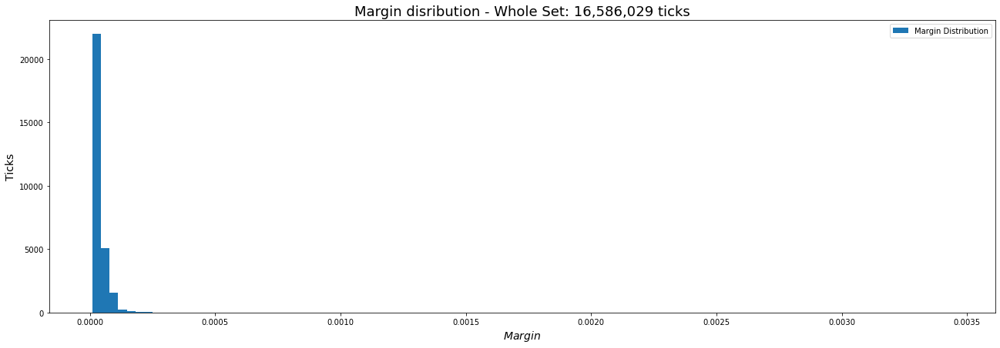

In [47]:
# Margin distribution

plt.figure(num=1, figsize=(22,7))
plt.hist(data_raw_Margin, bins=100, label='Margin Distribution', density=True) 


plt.title('Margin disribution - Whole Set: 16,586,029 ticks', size=18)
plt.ylabel('Ticks', size=14)
plt.xlabel('$Margin$', size=14)
plt.legend(loc='upper right')

plt.savefig('Figures/MarginDistribution-aii_ticks-2020-6-months.png')

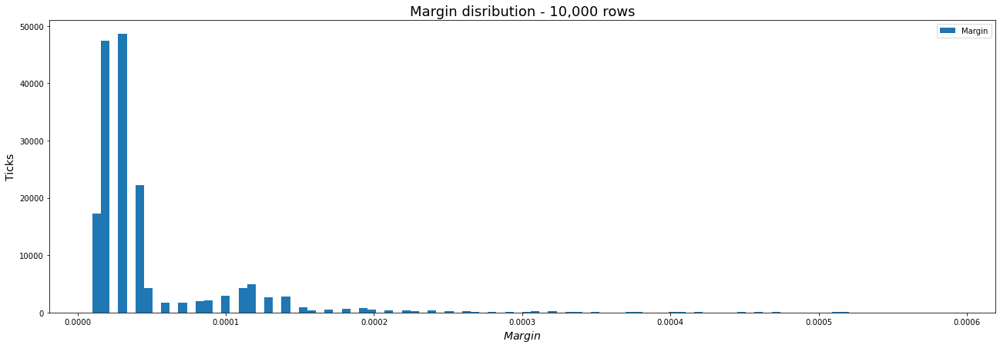

In [48]:
# The first 10.000 rows

NN = 10000

indexes_to_drop = np.array(range(NN,data_raw.shape[0]))
indexes_to_keep = set(range(data_raw_Margin.shape[0])) - set(indexes_to_drop)
data_raw_Margin_hist = data_raw['Margin'].take(list(indexes_to_keep))

data_raw_Margin_hist_array = np.array(data_raw_Margin_hist) 
data_raw_Margin_hist_array = data_raw_Margin_hist_array.reshape(NN)

plt.figure(num=1, figsize=(22,7))
plt.hist(data_raw_Margin_hist_array, bins=100, label='Margin', density=True) 


plt.title('Margin disribution - 10,000 rows', size=18)
plt.ylabel('Ticks', size=14)
plt.xlabel('$Margin$', size=14)
plt.legend(loc='upper right') 

plt.savefig('Figures/MarginDistribution-10000_rows-2020.png')

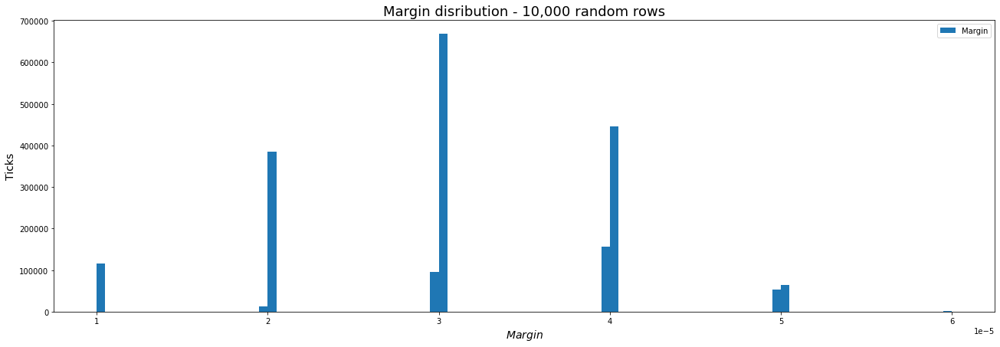

In [49]:
# 10.000 rows somewhere in the middle
import random

n_rand = random.randint(0, data_raw_Margin.shape[0] - 10000)

indexes_to_drop1 = np.array(range(0,n_rand))
indexes_to_drop2 = np.array(range(n_rand+10000,data_raw_Margin.shape[0]))
indexes_to_keep = set(range(data_raw_Margin.shape[0])) - set(indexes_to_drop1) - set(indexes_to_drop2)
data_raw_Margin_hist = data_raw['Margin'].take(list(indexes_to_keep))

data_raw_Margin_hist_array = np.array(data_raw_Margin_hist) 
data_raw_Margin_hist_array = data_raw_Margin_hist_array.reshape(10000)

plt.figure(num=1, figsize=(22,7))
plt.hist(data_raw_Margin_hist_array, bins=100, label='Margin', density=True) 

plt.title('Margin disribution - 10,000 random rows', size=18)
plt.ylabel('Ticks', size=14)
plt.xlabel('$Margin$', size=14)
plt.legend(loc='upper right') #

plt.savefig('Figures/MarginDistribution-10000_random_rows-2020.png')

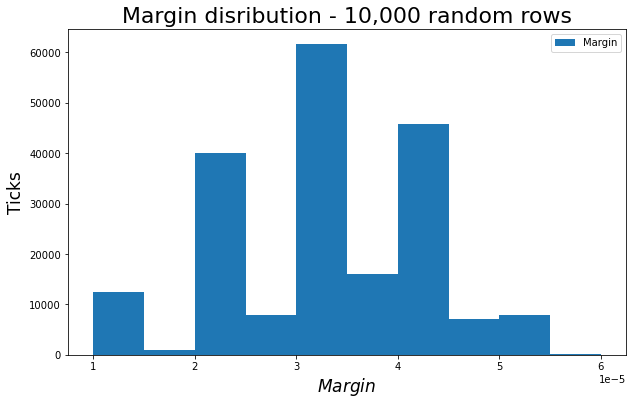

In [50]:
# 10.000 rows somewhere in the middle

import random

n_rand = random.randint(0, data_raw_Margin.shape[0] - 10000)

indexes_to_drop1 = np.array(range(0,n_rand))
indexes_to_drop2 = np.array(range(n_rand+10000,data_raw_Margin.shape[0]))
indexes_to_keep = set(range(data_raw_Margin.shape[0])) - set(indexes_to_drop1) - set(indexes_to_drop2)
data_raw_Margin_hist = data_raw['Margin'].take(list(indexes_to_keep))

data_raw_Margin_hist_array = np.array(data_raw_Margin_hist) 
data_raw_Margin_hist_array = data_raw_Margin_hist_array.reshape(10000)


plt.figure(num=1, figsize=(10,6))
plt.hist(data_raw_Margin_hist_array, bins=10, label='Margin', density=True) 

plt.title('Margin disribution - 10,000 random rows', size=22)
plt.ylabel('Ticks', size=17)
plt.xlabel('$Margin$', size=17)
plt.legend(loc='upper right') 

plt.savefig('Figures/MarginDistribution-10000-2_random_rows-2020.png')

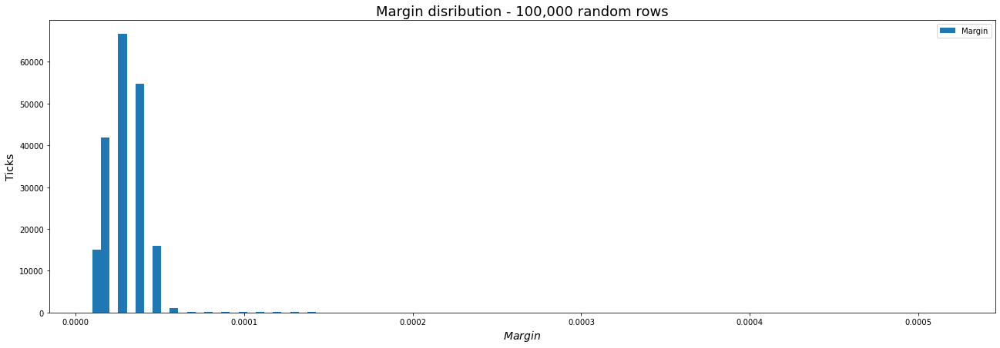

In [51]:
# 100.000 rows somewhere in the middle

import random

n_rand = random.randint(0, data_raw_Margin.shape[0] - 100000)

indexes_to_drop1 = np.array(range(0,n_rand))
indexes_to_drop2 = np.array(range(n_rand+100000,data_raw_Margin.shape[0]))
indexes_to_keep = set(range(data_raw_Margin.shape[0])) - set(indexes_to_drop1) - set(indexes_to_drop2)
data_raw_Margin_hist = data_raw['Margin'].take(list(indexes_to_keep))

data_raw_Margin_hist_array = np.array(data_raw_Margin_hist) 
data_raw_Margin_hist_array = data_raw_Margin_hist_array.reshape(100000)

plt.figure(num=1, figsize=(22,7))
plt.hist(data_raw_Margin_hist_array, bins=100, label='Margin', density=True) 

plt.title('Margin disribution - 100,000 random rows', size=18)
plt.ylabel('Ticks', size=14)
plt.xlabel('$Margin$', size=14)
plt.legend(loc='upper right') 

plt.savefig('Figures/MarginDistribution-100000-1_random_rows-2020.png')

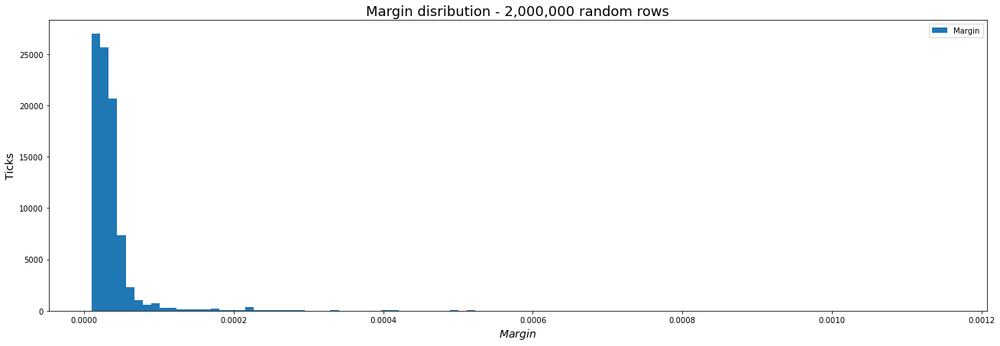

In [52]:
# 2.000.000 rows somewhere in the middle

import random

n_rand = random.randint(0, data_raw_Margin.shape[0] - 2000000)

indexes_to_drop1 = np.array(range(0,n_rand))
indexes_to_drop2 = np.array(range(n_rand+2000000,data_raw_Margin.shape[0]))
indexes_to_keep = set(range(data_raw_Margin.shape[0])) - set(indexes_to_drop1) - set(indexes_to_drop2)
data_raw_Margin_hist = data_raw['Margin'].take(list(indexes_to_keep))

data_raw_Margin_hist_array = np.array(data_raw_Margin_hist) 
data_raw_Margin_hist_array = data_raw_Margin_hist_array.reshape(2000000)

plt.figure(num=1, figsize=(22,7))
plt.hist(data_raw_Margin_hist_array, bins=100, label='Margin', density=True) 

plt.title('Margin disribution - 2,000,000 random rows', size=18)
plt.ylabel('Ticks', size=14)
plt.xlabel('$Margin$', size=14)
plt.legend(loc='upper right') 

plt.savefig('Figures/MarginDistribution-2000000_random_rows-2020.png')

## Days data

In [54]:
data_raw_days_Ask = pd.read_csv('Data/EURUSD_Daily_Ask_2019.12.31_2020.06.30.csv', low_memory=False, sep=',')
data_raw_days_Bid = pd.read_csv('Data/EURUSD_Daily_Bid_2019.12.31_2020.06.30.csv', low_memory=False, sep=',')


print(data_raw_days_Ask.head(n=5))
print(data_raw_days_Bid[-5:]) 

            Time (UTC)     Open     High      Low    Close      Volume 
0  2020.01.01 22:00:00  1.12158  1.12247  1.11638  1.11729  282243.1150
1  2020.01.02 22:00:00  1.11728  1.11800  1.11251  1.11626  224433.1250
2  2020.01.05 22:00:00  1.11687  1.12058  1.11574  1.11977  138759.6694
3  2020.01.06 22:00:00  1.11980  1.11980  1.11337  1.11543  144814.1100
4  2020.01.07 22:00:00  1.11543  1.11685  1.11018  1.11060  198430.8104
              Time (UTC)     Open     High      Low    Close      Volume 
125  2020.06.24 21:00:00  1.12503  1.12597  1.11903  1.12170  234684.1200
126  2020.06.25 21:00:00  1.12181  1.12393  1.11951  1.12170  175079.0520
127  2020.06.28 21:00:00  1.12149  1.12879  1.12149  1.12410  179170.7479
128  2020.06.29 21:00:00  1.12412  1.12619  1.11910  1.12336  196959.7740
129  2020.06.30 21:00:00  1.12340  1.12751  1.11848  1.12507  186639.9400


In [55]:

data_raw_days_Ask_2019 = pd.read_csv('Data/2019/EURUSD_Daily_Ask_2018.12.31_2019.12.31.csv', low_memory=False, sep=',')
data_raw_days_Bid_2019 = pd.read_csv('Data/2019/EURUSD_Daily_Bid_2018.12.31_2019.12.31.csv', low_memory=False, sep=',')


print(data_raw_days_Ask_2019.head(n=5)) 
print(data_raw_days_Bid_2019[-5:])

            Time (UTC)     Open     High      Low    Close    Volume 
0  2019.01.01 22:00:00  1.14682  1.14971  1.13253  1.13456  447727.82
1  2019.01.02 22:00:00  1.13456  1.14113  1.13098  1.13944  483691.02
2  2019.01.03 22:00:00  1.13946  1.14192  1.13459  1.13975  419587.69
3  2019.01.06 22:00:00  1.13997  1.14828  1.13981  1.14749  369487.32
4  2019.01.07 22:00:00  1.14747  1.14849  1.14224  1.14422  369776.16
              Time (UTC)     Open     High      Low    Close      Volume 
255  2019.12.24 22:00:00  1.10876  1.10885  1.10730  1.10821    2317.8500
256  2019.12.25 22:00:00  1.10885  1.11088  1.10821  1.10974   46848.9740
257  2019.12.26 22:00:00  1.10973  1.11883  1.10964  1.11713  133030.7323
258  2019.12.29 22:00:00  1.11736  1.12207  1.11718  1.11985  130942.6444
259  2019.12.30 22:00:00  1.11985  1.12391  1.11974  1.12076  110824.2900


In [56]:

data_raw_days_Ask_2018 = pd.read_csv('Data/2018/EURUSD_Daily_Ask_2017.12.31_2018.12.30.csv', low_memory=False, sep=',')
data_raw_days_Bid_2018 = pd.read_csv('Data/2018/EURUSD_Daily_Bid_2017.12.31_2018.12.30.csv', low_memory=False, sep=',')


print(data_raw_days_Ask_2018.head(n=5)) 
print(data_raw_days_Bid_2018.head(n=5)) 
print(data_raw_days_Bid_2018[-5:]) 

            Time (UTC)     Open     High      Low    Close    Volume 
0  2018.01.01 22:00:00  1.20143  1.20813  1.20044  1.20590  198843.00
1  2018.01.02 22:00:00  1.20590  1.20664  1.20015  1.20146  202783.87
2  2018.01.03 22:00:00  1.20146  1.20890  1.20046  1.20685  210052.72
3  2018.01.04 22:00:00  1.20684  1.20833  1.20209  1.20314  199758.33
4  2018.01.07 22:00:00  1.20297  1.20525  1.19561  1.19679  192051.28
            Time (UTC)     Open     High      Low    Close    Volume 
0  2018.01.01 22:00:00  1.20102  1.20811  1.20007  1.20583  198808.80
1  2018.01.02 22:00:00  1.20581  1.20662  1.20011  1.20141  194342.53
2  2018.01.03 22:00:00  1.20142  1.20889  1.20044  1.20680  211855.85
3  2018.01.04 22:00:00  1.20679  1.20829  1.20205  1.20304  195569.39
4  2018.01.07 22:00:00  1.20265  1.20521  1.19560  1.19666  183816.72
              Time (UTC)     Open     High      Low    Close    Volume 
255  2018.12.24 22:00:00  1.13976  1.14170  1.13894  1.13988    8155.28
256  2018.12.25 

In [57]:
# day volatility

In [58]:
daily_volatility = pd.DataFrame(columns=['2018', '2019', '2020'], dtype='float')
daily_volatility
daily_volatility.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2018    0 non-null      float64
 1   2019    0 non-null      float64
 2   2020    0 non-null      float64
dtypes: float64(3)
memory usage: 0.0+ bytes


In [59]:
daily_volatility[['2018']] = data_raw_days_Ask_2018[['High']] - data_raw_days_Bid_2018[['Low']].values
daily_volatility[['2019']] = data_raw_days_Ask_2019[['High']] - data_raw_days_Bid_2019[['Low']].values
daily_volatility[['2020']] = data_raw_days_Ask[['High']]      - data_raw_days_Bid[['Low']].values

daily_volatility.info()
print(daily_volatility.head(n=5)) 
print(daily_volatility[-5:])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260 entries, 0 to 259
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2018    260 non-null    float64
 1   2019    260 non-null    float64
 2   2020    130 non-null    float64
dtypes: float64(3)
memory usage: 6.2 KB
      2018     2019     2020
0  0.00806  0.01721  0.00612
1  0.00653  0.01021  0.00551
2  0.00846  0.00736  0.00487
3  0.00628  0.00874  0.00645
4  0.00965  0.00627  0.00669
        2018     2019  2020
255  0.00319  0.00177   NaN
256  0.00777  0.00271   NaN
257  0.01040  0.00921   NaN
258  0.00483  0.00491   NaN
259  0.00477  0.00419   NaN


In [60]:

daily_volatility[['2018', '2019', '2020']].iplot(
                                        kind='hist',
                                        histnorm='percent',
                                        barmode='overlay',
                                        xTitle='Volatility (delta of EURO/USD exchange rate)',
                                        yTitle='count (%)',
                                        title='Daily Volatitity')


In [61]:

daily_volatility.iplot(
        kind='box',
        yTitle='Volatitity',
        title='Daily Volatitity')

## Hour data

In [63]:

data_raw_hourly_Ask = pd.read_csv('Data/EURUSD_Hourly_Ask_2020.01.01_2020.06.30.csv', low_memory=False, sep=',')
data_raw_hourly_Bid = pd.read_csv('Data/EURUSD_Hourly_Bid_2020.01.01_2020.06.30.csv', low_memory=False, sep=',')


print(data_raw_hourly_Ask.head(n=5)) 
print(data_raw_hourly_Bid[-5:])

            Time (UTC)     Open     High      Low    Close  Volume 
0  2020.01.01 22:00:00  1.12154  1.12154  1.12154  1.12154     0.00
1  2020.01.01 23:00:00  1.12158  1.12228  1.12156  1.12191  1560.80
2  2020.01.02 00:00:00  1.12192  1.12193  1.12159  1.12185  1909.81
3  2020.01.02 01:00:00  1.12184  1.12247  1.12182  1.12213  3362.80
4  2020.01.02 02:00:00  1.12212  1.12247  1.12186  1.12226  2867.59
               Time (UTC)     Open     High      Low    Close   Volume 
3094  2020.06.30 19:00:00  1.12327  1.12387  1.12263  1.12337  6723.190
3095  2020.06.30 20:00:00  1.12336  1.12356  1.12305  1.12336  3191.170
3096  2020.06.30 21:00:00  1.12340  1.12364  1.12310  1.12314   742.025
3097  2020.06.30 22:00:00  1.12316  1.12362  1.12313  1.12349  1314.545
3098  2020.06.30 23:00:00  1.12348  1.12355  1.12328  1.12335  2553.770


In [64]:

data_raw_hourly_Ask_2019 = pd.read_csv('Data/2019/EURUSD_Hourly_Ask_2019.01.01_2019.12.31.csv', low_memory=False, sep=',')
data_raw_hourly_Bid_2019 = pd.read_csv('Data/2019/EURUSD_Hourly_Bid_2019.01.01_2019.12.31.csv', low_memory=False, sep=',')

print(data_raw_hourly_Ask_2019.head(n=5))
print(data_raw_hourly_Bid_2019[-5:])

            Time (UTC)     Open     High      Low    Close   Volume 
0  2019.01.01 22:00:00  1.14682  1.14691  1.14626  1.14641   1712.89
1  2019.01.01 23:00:00  1.14643  1.14686  1.14611  1.14616   9370.51
2  2019.01.02 00:00:00  1.14616  1.14630  1.14547  1.14566   8852.19
3  2019.01.02 01:00:00  1.14566  1.14566  1.14462  1.14526  11870.29
4  2019.01.02 02:00:00  1.14525  1.14537  1.14431  1.14459  14304.63
               Time (UTC)     Open     High      Low    Close   Volume 
6200  2019.12.30 20:00:00  1.12020  1.12035  1.11963  1.11983  3425.165
6201  2019.12.30 21:00:00  1.11983  1.12027  1.11978  1.11985  1376.280
6202  2019.12.30 22:00:00  1.11985  1.12042  1.11974  1.11995  1475.760
6203  2019.12.30 23:00:00  1.12029  1.12035  1.12012  1.12013  1571.970
6204  2019.12.31 00:00:00  1.12013  1.12050  1.12010  1.12035  1680.400


In [65]:

data_raw_hourly_Ask_2018 = pd.read_csv('Data/2018/EURUSD_Hourly_Ask_2018.01.01_2018.12.31.csv', low_memory=False, sep=',')
data_raw_hourly_Bid_2018 = pd.read_csv('Data/2018/EURUSD_Hourly_Bid_2018.01.01_2018.12.31.csv', low_memory=False, sep=',')


print(data_raw_hourly_Ask_2018.head(n=5)) 
print(data_raw_hourly_Bid_2018.head(n=5)) 
print(data_raw_hourly_Bid_2018[-5:]) 

            Time (UTC)     Open     High      Low    Close  Volume 
0  2018.01.01 22:00:00  1.20143  1.20173  1.20062  1.20158  1623.51
1  2018.01.01 23:00:00  1.20158  1.20161  1.20044  1.20110  6297.24
2  2018.01.02 00:00:00  1.20109  1.20178  1.20096  1.20162  3564.46
3  2018.01.02 01:00:00  1.20162  1.20232  1.20141  1.20159  6219.69
4  2018.01.02 02:00:00  1.20157  1.20165  1.20081  1.20096  5386.51
            Time (UTC)     Open     High      Low    Close  Volume 
0  2018.01.01 22:00:00  1.20102  1.20166  1.20007  1.20136  1687.29
1  2018.01.01 23:00:00  1.20137  1.20158  1.20026  1.20106  6885.93
2  2018.01.02 00:00:00  1.20105  1.20177  1.20092  1.20160  4362.53
3  2018.01.02 01:00:00  1.20159  1.20231  1.20139  1.20154  5860.19
4  2018.01.02 02:00:00  1.20153  1.20163  1.20078  1.20095  6161.26
               Time (UTC)     Open     High      Low    Close   Volume 
6200  2018.12.28 20:00:00  1.14412  1.14538  1.14410  1.14419  23544.86
6201  2018.12.28 21:00:00  1.14419  1.14

In [67]:
hourly_volatility = pd.DataFrame(columns=['2018', '2019', '2020'], dtype='float')
hourly_volatility
hourly_volatility.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2018    0 non-null      float64
 1   2019    0 non-null      float64
 2   2020    0 non-null      float64
dtypes: float64(3)
memory usage: 0.0+ bytes


In [68]:
hourly_volatility[['2018']] = data_raw_hourly_Ask_2018[['High']] - data_raw_hourly_Bid_2018[['Low']].values
hourly_volatility[['2019']] = data_raw_hourly_Ask_2019[['High']] - data_raw_hourly_Bid_2019[['Low']].values
hourly_volatility[['2020']] = data_raw_hourly_Ask[['High']]      - data_raw_hourly_Bid[['Low']].values

hourly_volatility.info()
print(hourly_volatility.head(n=5))
print(hourly_volatility[-5:]) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6205 entries, 0 to 6204
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2018    6205 non-null   float64
 1   2019    6205 non-null   float64
 2   2020    3099 non-null   float64
dtypes: float64(3)
memory usage: 145.6 KB
      2018     2019     2020
0  0.00166  0.00093  0.00078
1  0.00135  0.00120  0.00086
2  0.00086  0.00087  0.00036
3  0.00093  0.00109  0.00067
4  0.00087  0.00111  0.00063
         2018     2019  2020
6200  0.00132  0.00075   NaN
6201  0.00112  0.00052   NaN
6202  0.00072  0.00079   NaN
6203  0.00034  0.00025   NaN
6204  0.00124  0.00044   NaN


In [69]:

hourly_volatility[['2018', '2019', '2020']].iplot(
                                        kind='hist',
                                        histnorm='percent',
                                        barmode='overlay',
                                        xTitle='Volatility (delta of EURO/USD exchange rate)',
                                        yTitle='count (%)',
                                        title='Hourly Volatitity')

In [70]:

hourly_volatility.iplot(
        kind='box',
        yTitle='Volatitity (delta of EURO/USD exchange rate)',
        title='Hourly Volatitity')

## 30-minutes volatility

In [72]:

data_raw_30_Mins_Ask = pd.read_csv('Data/EURUSD_30 Mins_Ask_2020.01.01_2020.06.30.csv', low_memory=False, sep=',')
data_raw_30_Mins_Bid = pd.read_csv('Data/EURUSD_30 Mins_Bid_2020.01.01_2020.06.30.csv', low_memory=False, sep=',')

print(data_raw_30_Mins_Ask.head(n=5)) 
print(data_raw_30_Mins_Bid[-5:])

            Time (UTC)     Open     High      Low    Close   Volume 
0  2020.01.01 22:00:00  1.12172  1.12179  1.12124  1.12163   299.764
1  2020.01.01 22:30:00  1.12166  1.12173  1.12156  1.12157   588.540
2  2020.01.01 23:00:00  1.12158  1.12228  1.12156  1.12213   973.810
3  2020.01.01 23:30:00  1.12214  1.12219  1.12180  1.12191   586.990
4  2020.01.02 00:00:00  1.12192  1.12193  1.12159  1.12164  1127.490
               Time (UTC)     Open     High      Low    Close   Volume 
6193  2020.06.30 21:30:00  1.12336  1.12337  1.12310  1.12314   574.600
6194  2020.06.30 22:00:00  1.12316  1.12362  1.12313  1.12355   717.875
6195  2020.06.30 22:30:00  1.12356  1.12362  1.12341  1.12349   596.670
6196  2020.06.30 23:00:00  1.12348  1.12355  1.12328  1.12332  1079.430
6197  2020.06.30 23:30:00  1.12332  1.12346  1.12329  1.12335  1474.340


In [73]:

data_raw_30_Mins_Ask_2019 = pd.read_csv('Data/2019/EURUSD_30 Mins_Ask_2019.01.01_2019.12.31.csv', low_memory=False, sep=',')
data_raw_30_Mins_Bid_2019 = pd.read_csv('Data/2019/EURUSD_30 Mins_Bid_2019.01.01_2019.12.31.csv', low_memory=False, sep=',')

print(data_raw_30_Mins_Ask_2019.head(n=5)) 
print(data_raw_30_Mins_Bid_2019[-5:]) 

            Time (UTC)     Open     High      Low    Close  Volume 
0  2019.01.01 22:00:00  1.14682  1.14691  1.14636  1.14660   494.50
1  2019.01.01 22:30:00  1.14662  1.14675  1.14626  1.14641  1218.39
2  2019.01.01 23:00:00  1.14643  1.14686  1.14611  1.14669  5908.96
3  2019.01.01 23:30:00  1.14669  1.14673  1.14614  1.14616  3461.55
4  2019.01.02 00:00:00  1.14616  1.14630  1.14578  1.14583  5144.20
                Time (UTC)     Open     High      Low    Close  Volume 
12404  2019.12.30 22:00:00  1.11985  1.12042  1.11985  1.11997   442.32
12405  2019.12.30 22:30:00  1.11997  1.12036  1.11974  1.11995  1033.44
12406  2019.12.30 23:00:00  1.12029  1.12035  1.12016  1.12028   712.73
12407  2019.12.30 23:30:00  1.12029  1.12033  1.12012  1.12013   859.24
12408  2019.12.31 00:00:00  1.12013  1.12036  1.12010  1.12036   916.51


In [74]:

data_raw_30_Mins_Ask_2018 = pd.read_csv('Data/2018/EURUSD_30 Mins_Ask_2018.01.01_2018.12.31.csv', low_memory=False, sep=',')
data_raw_30_Mins_Bid_2018 = pd.read_csv('Data/2018/EURUSD_30 Mins_Bid_2018.01.01_2018.12.31.csv', low_memory=False, sep=',')


print(data_raw_30_Mins_Ask_2018.head(n=5)) 
print(data_raw_30_Mins_Bid_2018.head(n=5)) 
print(data_raw_30_Mins_Bid_2018[-5:]) 

            Time (UTC)     Open     High      Low    Close  Volume 
0  2018.01.01 22:00:00  1.20143  1.20148  1.20062  1.20085   920.58
1  2018.01.01 22:30:00  1.20083  1.20173  1.20083  1.20158   702.93
2  2018.01.01 23:00:00  1.20158  1.20161  1.20044  1.20141  4018.41
3  2018.01.01 23:30:00  1.20143  1.20155  1.20098  1.20110  2278.83
4  2018.01.02 00:00:00  1.20109  1.20178  1.20096  1.20148  2178.16
            Time (UTC)     Open     High      Low    Close  Volume 
0  2018.01.01 22:00:00  1.20102  1.20106  1.20007  1.20064   853.06
1  2018.01.01 22:30:00  1.20064  1.20166  1.20062  1.20136   834.23
2  2018.01.01 23:00:00  1.20137  1.20158  1.20026  1.20135  4130.51
3  2018.01.01 23:30:00  1.20136  1.20151  1.20093  1.20106  2755.42
4  2018.01.02 00:00:00  1.20105  1.20177  1.20092  1.20143  1874.49
                Time (UTC)     Open     High      Low    Close  Volume 
12404  2018.12.30 22:00:00  1.14331  1.14368  1.14331  1.14364   349.41
12405  2018.12.30 22:30:00  1.14365  1.1

In [76]:
volatility_30_Mins = pd.DataFrame(columns=['2018', '2019', '2020'], dtype='float')
volatility_30_Mins
volatility_30_Mins.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2018    0 non-null      float64
 1   2019    0 non-null      float64
 2   2020    0 non-null      float64
dtypes: float64(3)
memory usage: 0.0+ bytes


In [77]:
volatility_30_Mins[['2018']] = data_raw_30_Mins_Ask_2018[['High']] - data_raw_30_Mins_Bid_2018[['Low']].values
volatility_30_Mins[['2019']] = data_raw_30_Mins_Ask_2019[['High']] - data_raw_30_Mins_Bid_2019[['Low']].values
volatility_30_Mins[['2020']] = data_raw_30_Mins_Ask[['High']]      - data_raw_30_Mins_Bid[['Low']].values

volatility_30_Mins.info()
print(volatility_30_Mins.head(n=5)) 
print(volatility_30_Mins[-5:]) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12409 entries, 0 to 12408
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2018    12409 non-null  float64
 1   2019    12409 non-null  float64
 2   2020    6198 non-null   float64
dtypes: float64(3)
memory usage: 291.0 KB
      2018     2019     2020
0  0.00141  0.00093  0.00059
1  0.00111  0.00073  0.00035
2  0.00135  0.00120  0.00086
3  0.00062  0.00063  0.00043
4  0.00086  0.00057  0.00036
          2018     2019  2020
12404  0.00072  0.00068   NaN
12405  0.00042  0.00072   NaN
12406  0.00027  0.00021   NaN
12407  0.00023  0.00024   NaN
12408  0.00101  0.00029   NaN


In [78]:

volatility_30_Mins[['2018', '2019', '2020']].iplot(
                                        kind='hist',
                                        histnorm='percent',
                                        barmode='overlay',
                                        xTitle='Volatility (delta of EURO/USD exchange rate)',
                                        yTitle='count (%)',
                                        title='30_Mins Volatitity')

In [79]:

volatility_30_Mins.iplot(
        kind='box',
        yTitle='Volatitity (delta of EURO/USD exchange rate)',
        title='30_Mins Volatitity')

## 15-minutes data

In [82]:

data_raw_15_Mins_Ask = pd.read_csv('Data/EURUSD_15 Mins_Ask_2020.01.01_2020.06.30.csv', low_memory=False, sep=',')
data_raw_15_Mins_Bid = pd.read_csv('Data/EURUSD_15 Mins_Bid_2020.01.01_2020.06.30.csv', low_memory=False, sep=',')


print(data_raw_15_Mins_Ask.head(n=5)) 
print(data_raw_15_Mins_Bid[-5:]) 

            Time (UTC)     Open     High      Low    Close  Volume 
0  2020.01.01 22:00:00  1.12172  1.12179  1.12124  1.12152   63.874
1  2020.01.01 22:15:00  1.12150  1.12169  1.12143  1.12163  235.890
2  2020.01.01 22:30:00  1.12166  1.12169  1.12157  1.12162   80.600
3  2020.01.01 22:45:00  1.12166  1.12173  1.12156  1.12157  507.940
4  2020.01.01 23:00:00  1.12158  1.12228  1.12156  1.12203  741.000
                Time (UTC)     Open     High      Low    Close  Volume 
12391  2020.06.30 22:45:00  1.12348  1.12356  1.12341  1.12349   352.65
12392  2020.06.30 23:00:00  1.12348  1.12355  1.12341  1.12341   391.95
12393  2020.06.30 23:15:00  1.12342  1.12344  1.12328  1.12332   687.48
12394  2020.06.30 23:30:00  1.12332  1.12344  1.12329  1.12339   964.76
12395  2020.06.30 23:45:00  1.12338  1.12346  1.12333  1.12335   509.58


In [83]:

data_raw_15_Mins_Ask_2019 = pd.read_csv('Data/2019/EURUSD_15 Mins_Ask_2019.01.01_2019.12.31.csv', low_memory=False, sep=',')
data_raw_15_Mins_Bid_2019 = pd.read_csv('Data/2019/EURUSD_15 Mins_Bid_2019.01.01_2019.12.31.csv', low_memory=False, sep=',')

print(data_raw_15_Mins_Ask_2019.head(n=5)) 
print(data_raw_15_Mins_Bid_2019[-5:]) 

            Time (UTC)     Open     High      Low    Close  Volume 
0  2019.01.01 22:00:00  1.14682  1.14691  1.14636  1.14667   283.78
1  2019.01.01 22:15:00  1.14669  1.14675  1.14636  1.14660   210.72
2  2019.01.01 22:30:00  1.14662  1.14674  1.14626  1.14643   306.78
3  2019.01.01 22:45:00  1.14643  1.14675  1.14630  1.14641   911.61
4  2019.01.01 23:00:00  1.14643  1.14686  1.14611  1.14662  2306.68
                Time (UTC)     Open     High      Low    Close  Volume 
24812  2019.12.30 23:00:00  1.12029  1.12032  1.12016  1.12028   470.31
24813  2019.12.30 23:15:00  1.12028  1.12035  1.12027  1.12028   242.42
24814  2019.12.30 23:30:00  1.12029  1.12033  1.12014  1.12018   504.31
24815  2019.12.30 23:45:00  1.12019  1.12031  1.12012  1.12013   354.93
24816  2019.12.31 00:00:00  1.12013  1.12035  1.12010  1.12028   558.66


In [84]:

data_raw_15_Mins_Ask_2018 = pd.read_csv('Data/2018/EURUSD_15 Mins_Ask_2018.01.01_2018.12.31.csv', low_memory=False, sep=',')
data_raw_15_Mins_Bid_2018 = pd.read_csv('Data/2018/EURUSD_15 Mins_Bid_2018.01.01_2018.12.31.csv', low_memory=False, sep=',')


print(data_raw_15_Mins_Ask_2018.head(n=5)) 
print(data_raw_15_Mins_Bid_2018.head(n=5)) 
print(data_raw_15_Mins_Bid_2018[-5:]) 

            Time (UTC)     Open     High      Low    Close  Volume 
0  2018.01.01 22:00:00  1.20143  1.20148  1.20062  1.20105   229.03
1  2018.01.01 22:15:00  1.20104  1.20131  1.20076  1.20085   691.55
2  2018.01.01 22:30:00  1.20083  1.20173  1.20083  1.20162   423.00
3  2018.01.01 22:45:00  1.20160  1.20165  1.20145  1.20158   279.93
4  2018.01.01 23:00:00  1.20158  1.20158  1.20044  1.20154  2216.51
            Time (UTC)     Open     High      Low    Close  Volume 
0  2018.01.01 22:00:00  1.20102  1.20103  1.20007  1.20093   259.03
1  2018.01.01 22:15:00  1.20094  1.20106  1.20054  1.20064   594.03
2  2018.01.01 22:30:00  1.20064  1.20166  1.20062  1.20140   392.86
3  2018.01.01 22:45:00  1.20139  1.20150  1.20131  1.20136   441.37
4  2018.01.01 23:00:00  1.20137  1.20148  1.20026  1.20147  2528.19
                Time (UTC)     Open     High      Low    Close  Volume 
24812  2018.12.30 23:00:00  1.14393  1.14406  1.14391  1.14392  1941.02
24813  2018.12.30 23:15:00  1.14393  1.1

In [86]:
volatility_15_Mins = pd.DataFrame(columns=['2018', '2019', '2020'], dtype='float')
volatility_15_Mins
volatility_15_Mins.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2018    0 non-null      float64
 1   2019    0 non-null      float64
 2   2020    0 non-null      float64
dtypes: float64(3)
memory usage: 0.0+ bytes


In [87]:
volatility_15_Mins[['2018']] = data_raw_15_Mins_Ask_2018[['High']] - data_raw_15_Mins_Bid_2018[['Low']].values
volatility_15_Mins[['2019']] = data_raw_15_Mins_Ask_2019[['High']] - data_raw_15_Mins_Bid_2019[['Low']].values
volatility_15_Mins[['2020']] = data_raw_15_Mins_Ask[['High']]      - data_raw_15_Mins_Bid[['Low']].values

volatility_15_Mins.info()
print(volatility_15_Mins.head(n=5)) 
print(volatility_15_Mins[-5:]) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24817 entries, 0 to 24816
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2018    24817 non-null  float64
 1   2019    24817 non-null  float64
 2   2020    12396 non-null  float64
dtypes: float64(3)
memory usage: 581.8 KB
      2018     2019     2020
0  0.00141  0.00093  0.00059
1  0.00077  0.00071  0.00042
2  0.00111  0.00071  0.00031
3  0.00034  0.00073  0.00030
4  0.00132  0.00120  0.00086
          2018     2019  2020
24812  0.00022  0.00020   NaN
24813  0.00021  0.00010   NaN
24814  0.00023  0.00022   NaN
24815  0.00013  0.00020   NaN
24816  0.00052  0.00028   NaN


In [88]:

volatility_15_Mins[['2018', '2019', '2020']].iplot(
                                        kind='hist',
                                        histnorm='percent',
                                        barmode='overlay',
                                        xTitle='Volatility',
                                        yTitle='count, %',
                                        title='15-Mins Volatitity')

In [89]:

volatility_15_Mins.iplot(
        kind='box',
        yTitle='Volatitity',
        title='30_Mins Volatitity')

### Intday trading advantages due to reduced fractal dimension and volatility

In [90]:

print(data_raw_hourly_Ask.head(n=5)) 
print(data_raw_hourly_Ask[-5:]) 

            Time (UTC)     Open     High      Low    Close  Volume 
0  2020.01.01 22:00:00  1.12154  1.12154  1.12154  1.12154     0.00
1  2020.01.01 23:00:00  1.12158  1.12228  1.12156  1.12191  1560.80
2  2020.01.02 00:00:00  1.12192  1.12193  1.12159  1.12185  1909.81
3  2020.01.02 01:00:00  1.12184  1.12247  1.12182  1.12213  3362.80
4  2020.01.02 02:00:00  1.12212  1.12247  1.12186  1.12226  2867.59
               Time (UTC)     Open     High      Low    Close   Volume 
3094  2020.06.30 19:00:00  1.12328  1.12388  1.12264  1.12338  6442.970
3095  2020.06.30 20:00:00  1.12338  1.12359  1.12307  1.12341  2947.780
3096  2020.06.30 21:00:00  1.12347  1.12373  1.12321  1.12325  1590.380
3097  2020.06.30 22:00:00  1.12325  1.12367  1.12323  1.12353  1775.355
3098  2020.06.30 23:00:00  1.12352  1.12360  1.12332  1.12338  2710.450


In [91]:
# Daily_Volatility
daily_volatility2 = pd.DataFrame(columns=['2020'], dtype='float')
daily_volatility2[['2020']] = data_raw_days_Ask[['High']] - data_raw_days_Ask[['Low']].values

daily_volatility2.info()
print(daily_volatility2['2020'].head(n=5)) 
print(daily_volatility2['2020'].tail(5)) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130 entries, 0 to 129
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2020    130 non-null    float64
dtypes: float64(1)
memory usage: 1.1 KB
0    0.00609
1    0.00549
2    0.00484
3    0.00643
4    0.00667
Name: 2020, dtype: float64
125    0.00693
126    0.00441
127    0.00706
128    0.00709
129    0.00903
Name: 2020, dtype: float64


In [92]:
Daily_Volatility2 = daily_volatility2['2020'].sum()
Daily_Volatility2

1.1714299999999995

In [93]:
# Hourly_Volatility
hourly_volatility2 = pd.DataFrame(columns=['2020'], dtype='float')
hourly_volatility2[['2020']] = data_raw_hourly_Ask[['High']] - data_raw_hourly_Ask[['Low']].values

hourly_volatility2.info()
print(hourly_volatility2['2020'].head(n=5)) 
print(hourly_volatility2['2020'].tail(5)) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3099 entries, 0 to 3098
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2020    3099 non-null   float64
dtypes: float64(1)
memory usage: 24.3 KB
0    0.00000
1    0.00072
2    0.00034
3    0.00065
4    0.00061
Name: 2020, dtype: float64
3094    0.00124
3095    0.00052
3096    0.00052
3097    0.00044
3098    0.00028
Name: 2020, dtype: float64


In [94]:
Hourly_Volatility = hourly_volatility2['2020'].sum()
Hourly_Volatility

5.173710000000006

In [95]:
# volatility_5_Mins

data_raw_5_Mins_Ask = pd.read_csv('Data/EURUSD_5 Mins_Ask_2020.01.01_2020.06.30.csv', low_memory=False, sep=',')

print(data_raw_5_Mins_Ask.head(n=5)) 
print(data_raw_5_Mins_Ask[-5:])

            Time (UTC)     Open     High      Low    Close  Volume 
0  2020.01.01 22:00:00  1.12172  1.12179  1.12151  1.12151   15.604
1  2020.01.01 22:05:00  1.12151  1.12175  1.12133  1.12159   14.180
2  2020.01.01 22:10:00  1.12158  1.12162  1.12124  1.12152   34.090
3  2020.01.01 22:15:00  1.12150  1.12169  1.12143  1.12151   85.170
4  2020.01.01 22:20:00  1.12151  1.12168  1.12150  1.12164  131.060
                Time (UTC)     Open     High      Low    Close  Volume 
37183  2020.06.30 23:35:00  1.12344  1.12346  1.12337  1.12338   286.17
37184  2020.06.30 23:40:00  1.12340  1.12343  1.12335  1.12343   303.22
37185  2020.06.30 23:45:00  1.12343  1.12349  1.12339  1.12340   206.24
37186  2020.06.30 23:50:00  1.12339  1.12349  1.12337  1.12342   173.28
37187  2020.06.30 23:55:00  1.12343  1.12343  1.12337  1.12338   209.57


In [96]:
volatility_5_Mins = pd.DataFrame(columns=['2020'], dtype='float')
volatility_5_Mins[['2020']] = data_raw_5_Mins_Ask[['High']] - data_raw_5_Mins_Ask[['Low']].values

volatility_5_Mins.info()
print(volatility_5_Mins['2020'].head(n=5)) 
print(volatility_5_Mins['2020'].tail(5)) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37188 entries, 0 to 37187
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2020    37188 non-null  float64
dtypes: float64(1)
memory usage: 290.7 KB
0    0.00028
1    0.00042
2    0.00038
3    0.00026
4    0.00018
Name: 2020, dtype: float64
37183    0.00009
37184    0.00008
37185    0.00010
37186    0.00012
37187    0.00006
Name: 2020, dtype: float64


In [97]:
Volatility_5_Mins = volatility_5_Mins['2020'].sum()
Volatility_5_Mins

16.959519999999994

In [98]:
# volatility_1_Min

data_raw_1_Min_Ask = pd.read_csv('Data/EURUSD_1 Min_Ask_2020.01.01_2020.06.30.csv', low_memory=False, sep=',')

print(data_raw_1_Min_Ask.head(n=5))
print(data_raw_1_Min_Ask[-5:])

            Time (UTC)     Open     High      Low    Close  Volume 
0  2020.01.01 22:00:00  1.12154  1.12154  1.12154  1.12154    0.000
1  2020.01.01 22:01:00  1.12154  1.12154  1.12154  1.12154    0.000
2  2020.01.01 22:02:00  1.12172  1.12179  1.12171  1.12172    3.644
3  2020.01.01 22:03:00  1.12171  1.12172  1.12171  1.12172    9.520
4  2020.01.01 22:04:00  1.12171  1.12172  1.12151  1.12151    2.440
                 Time (UTC)     Open     High      Low    Close  Volume 
185935  2020.06.30 23:55:00  1.12343  1.12343  1.12338  1.12341    82.03
185936  2020.06.30 23:56:00  1.12340  1.12341  1.12338  1.12338    45.86
185937  2020.06.30 23:57:00  1.12339  1.12339  1.12337  1.12339    16.40
185938  2020.06.30 23:58:00  1.12338  1.12340  1.12337  1.12338    29.41
185939  2020.06.30 23:59:00  1.12339  1.12343  1.12338  1.12338    35.87


In [99]:

volatility_1_Min = pd.DataFrame(columns=['2020'], dtype='float')
volatility_1_Min[['2020']] = data_raw_1_Min_Ask[['High']] - data_raw_1_Min_Ask[['Low']].values

volatility_1_Min.info()
print(volatility_1_Min['2020'].head(n=5)) 
print(volatility_1_Min['2020'].tail(5)) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 185940 entries, 0 to 185939
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   2020    185940 non-null  float64
dtypes: float64(1)
memory usage: 1.4 MB
0    0.00000
1    0.00000
2    0.00008
3    0.00001
4    0.00021
Name: 2020, dtype: float64
185935    0.00005
185936    0.00003
185937    0.00002
185938    0.00003
185939    0.00005
Name: 2020, dtype: float64


In [100]:
Volatility_1_Min = volatility_1_Min['2020'].sum()
Volatility_1_Min

34.43332999999998

In [101]:
# summary volatility DataFrame 
Volatility_compare = pd.DataFrame(columns=['2020'], dtype='float')
Volatility_compare.loc[0] = Volatility_1_Min
Volatility_compare.loc[1] = Volatility_5_Mins
Volatility_compare.loc[2] = Hourly_Volatility
Volatility_compare.loc[3] = Daily_Volatility2
Volatility_compare['Term'] =['1 min', '5 mins', '1 hour', '1 day']

Volatility_compare['%'] = Volatility_compare['2020'] / Volatility_1_Min * 100

Volatility_compare.info()
Volatility_compare

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4 entries, 0 to 3
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2020    4 non-null      float64
 1   Term    4 non-null      object 
 2   %       4 non-null      float64
dtypes: float64(2), object(1)
memory usage: 128.0+ bytes


,2020,Term,%
0,34.43333,1 min,100.000000
1,16.95952,5 mins,49.253209
2,5.17371,1 hour,15.025297
3,1.17143,1 day,3.402024


In [102]:
Volatility_compare.iplot(kind='bar', x='Term', y='2020', xTitle='Time-frame', yTitle='Sum of the volatility',
    title='Sum of the volatility of the different time-frames for half of the 2020 year')

In [103]:
Volatility_compare.iplot(kind='bar', x='Term', y='%', xTitle='Time-frame', 
    yTitle='Sum of the volatility (% of 1 min volatility)',
    title='Sum of the volatility of the different time-frames for half of the 2020 year, (% of 1 min volatility)')